In [1]:
DIR="/home/chenzh/My_project/sc_pan"

In [2]:
TD="Oct_2023"

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
import scvelo as scv
import os
import numpy as np
import pandas as pd
import scanpy as sc
#from matplotlib import rcParams
import matplotlib.pyplot as plt
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params('scvelo',dpi_save=300)  # for beautified visualization
plt.rcParams['pdf.fonttype'] = 'truetype'


/tmp/ipykernel_3838039/3459204846.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML


In [4]:
os.chdir(DIR)

In [5]:
scv.set_figure_params()

In [6]:
scv.settings.set_figure_params('scvelo')  #



In [7]:
adata = sc.read("/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.h5ad")

### preprocessing for whole cells

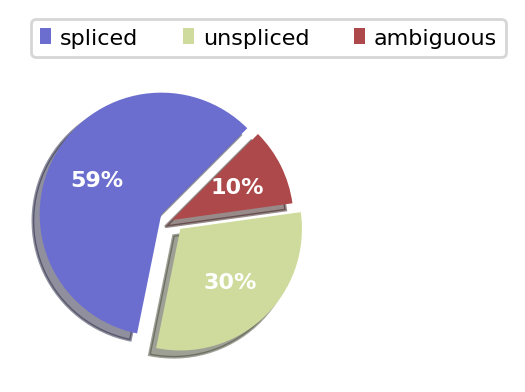

Filtered out 23396 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/tmp/ipykernel_3838039/2427098591.py:6: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be

computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities


/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/64 cores)


  0%|          | 0/5946 [00:00<?, ?cells/s]

    finished (0:00:27) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [8]:
adata = sc.read("/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.h5ad")
adata.obsm['X_umap']=adata.obs[["UMAP_1","UMAP_2"]].to_numpy()
adata.obsm['X_umap'].shape
scv.pl.proportions(adata)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
#scv.tl.recover_dynamics(adata,n_jobs=15)
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site

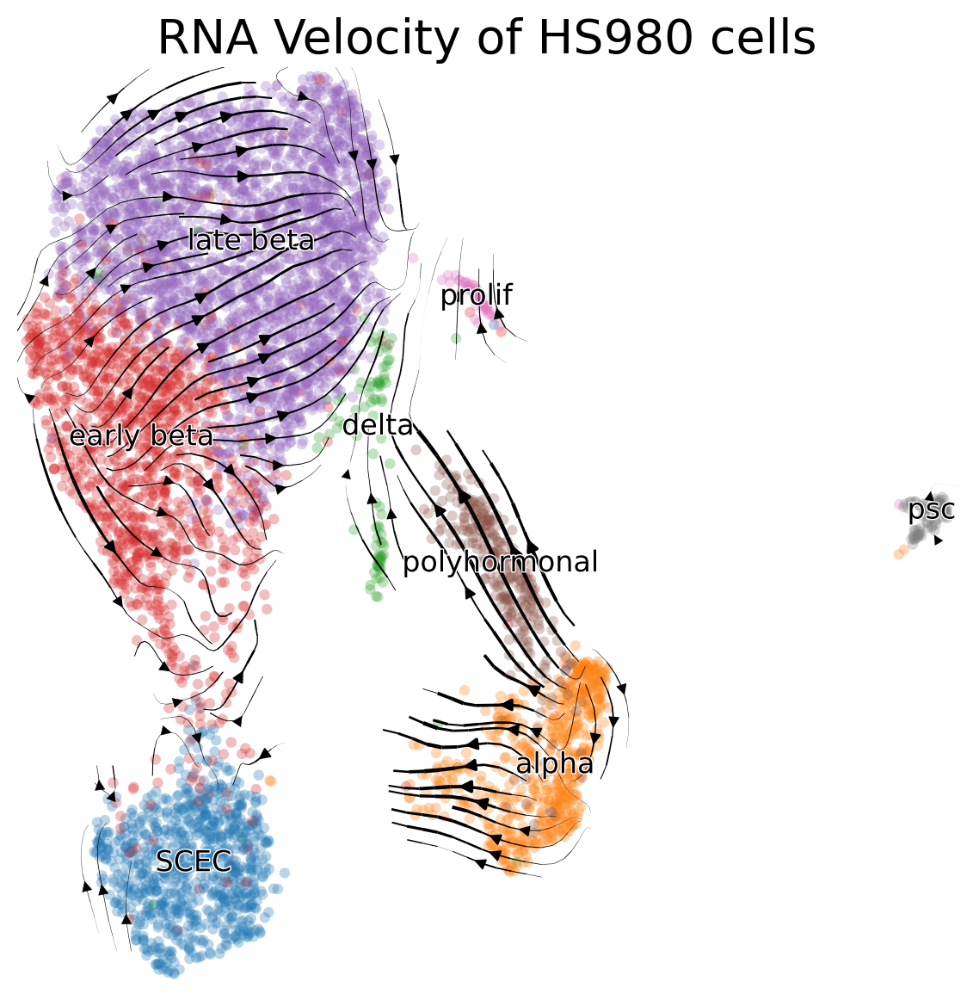

In [9]:
scv.pl.velocity_embedding_stream(
    adata, basis='umap',color="EML",fontsize=20,size=80,arrow_size=1,figsize=(7,7),title='RNA Velocity of HS980 cells',legend_fontweight='normal'
)

/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:65: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotti

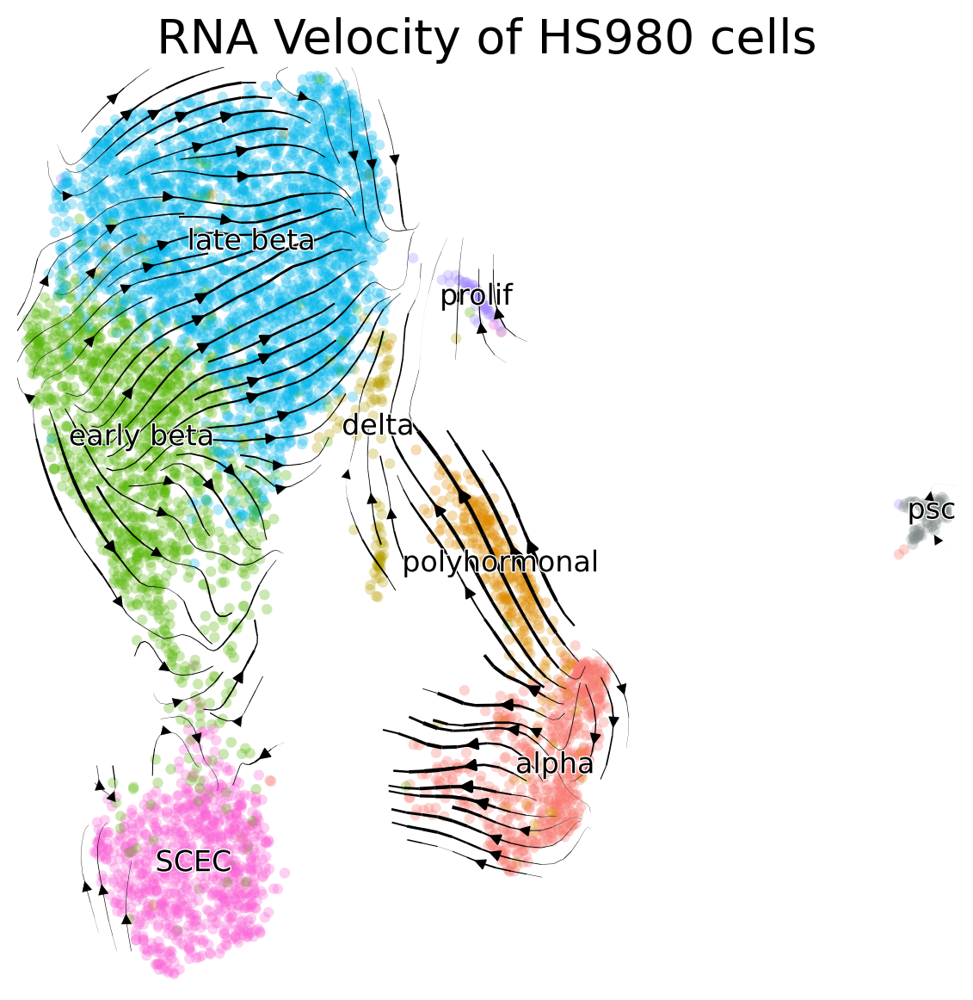

/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotting/utils.py:65: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return cat(data)  # if data is categorical/array
/home/chenzh/miniconda3/envs/py3.10/lib/python3.10/site-packages/scvelo/plotti

saving figure to file /home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.svg


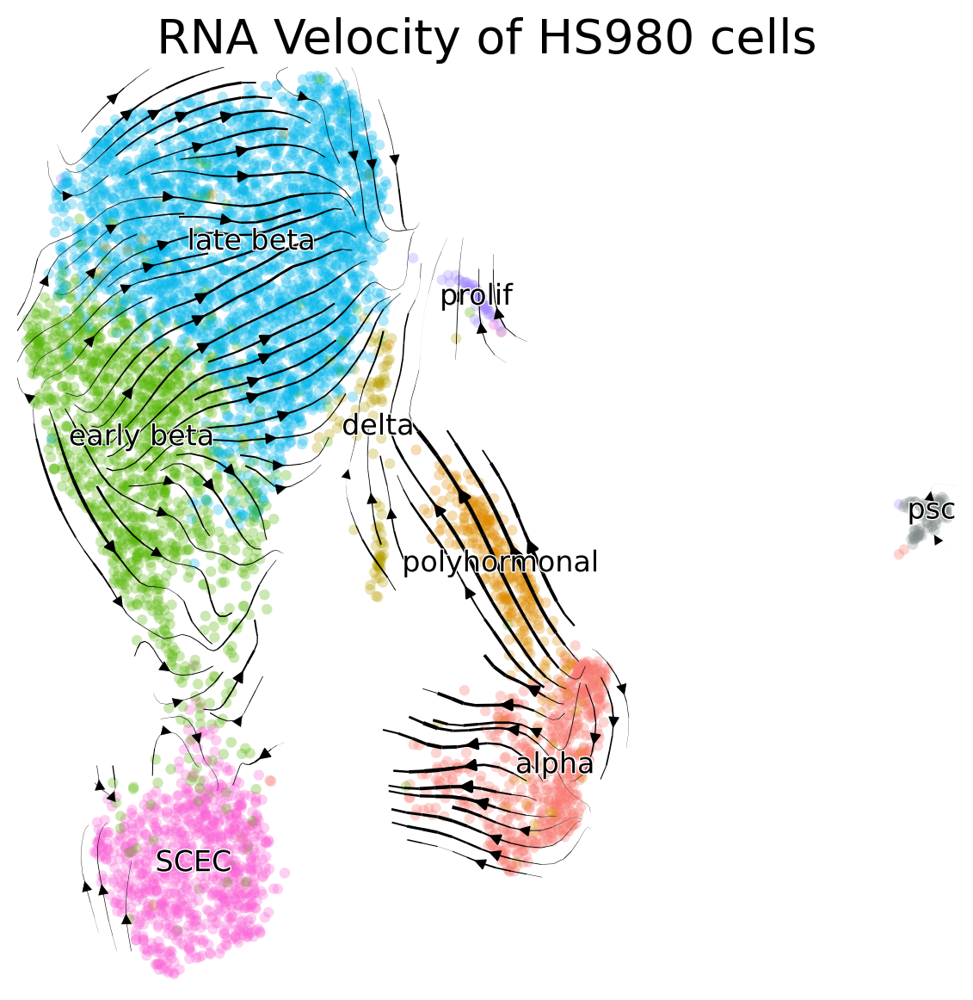

In [10]:
p_col={"alpha":"#f8766d","early_beta":"#53b400","late_beta":"#00b6eb", "SCEC":"#fb61d7","exo":"#c2b59b","polyhormonal":"#de8c00","delta":"#b79f00","prolif":"#a58aff","psc":"#838b8b"}
scv.pl.velocity_embedding_stream(
    adata, basis='umap',color="EML",fontsize=20,size=80,arrow_size=1,figsize=(7,7),title='RNA Velocity of HS980 cells',
    palette=p_col,legend_fontweight='normal'
)
scv.pl.velocity_embedding_stream(
    adata, basis='umap',color="EML",fontsize=20,size=80,arrow_size=1,figsize=(7,7),title='RNA Velocity of HS980 cells',
    palette=p_col,legend_fontweight='normal',
    save='/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.svg'
)

In [24]:
#scv.pl.velocity(beta_adata, ['IAPP',  'HOPX', 'IGF2', 'NEFM',"SIX2","LDHA"], ncols=2)

### Susbeting beta cells


### Dynamic processing for beta cells only to get latent time

In [13]:
adata = sc.read("/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.h5ad")
adata.obsm['X_umap']=adata.obs[["UMAP_1","UMAP_2"]].to_numpy()
adata.obsm['X_umap'].shape

beta_adata=adata[adata.obs["EML"].isin(["Mature_Beta","Early_Beta"])].copy()
del adata 

scv.pl.proportions(beta_adata)
scv.pp.filter_and_normalize(beta_adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(beta_adata, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(beta_adata,n_jobs=15)
scv.tl.velocity(beta_adata, mode='dynamical')
scv.tl.velocity_graph(beta_adata)

RuntimeError: Invalid vertices array.

ValueError: need at least one array to concatenate

<Figure size 1000x200 with 1 Axes>

In [8]:
type(beta_adata)

anndata._core.anndata.AnnData

computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


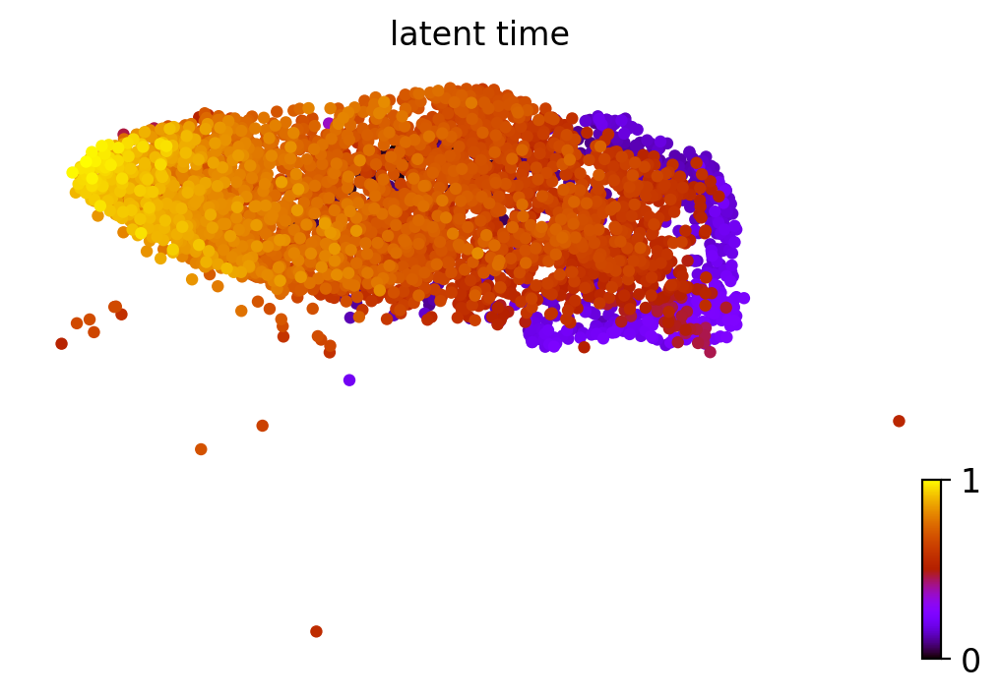

In [9]:
scv.tl.latent_time(beta_adata)
scv.pl.scatter(beta_adata, color='latent_time', color_map='gnuplot', size=80)

In [10]:
beta_adata.obs.to_csv("/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/Vel.cell.meta.csv")

# not used from here

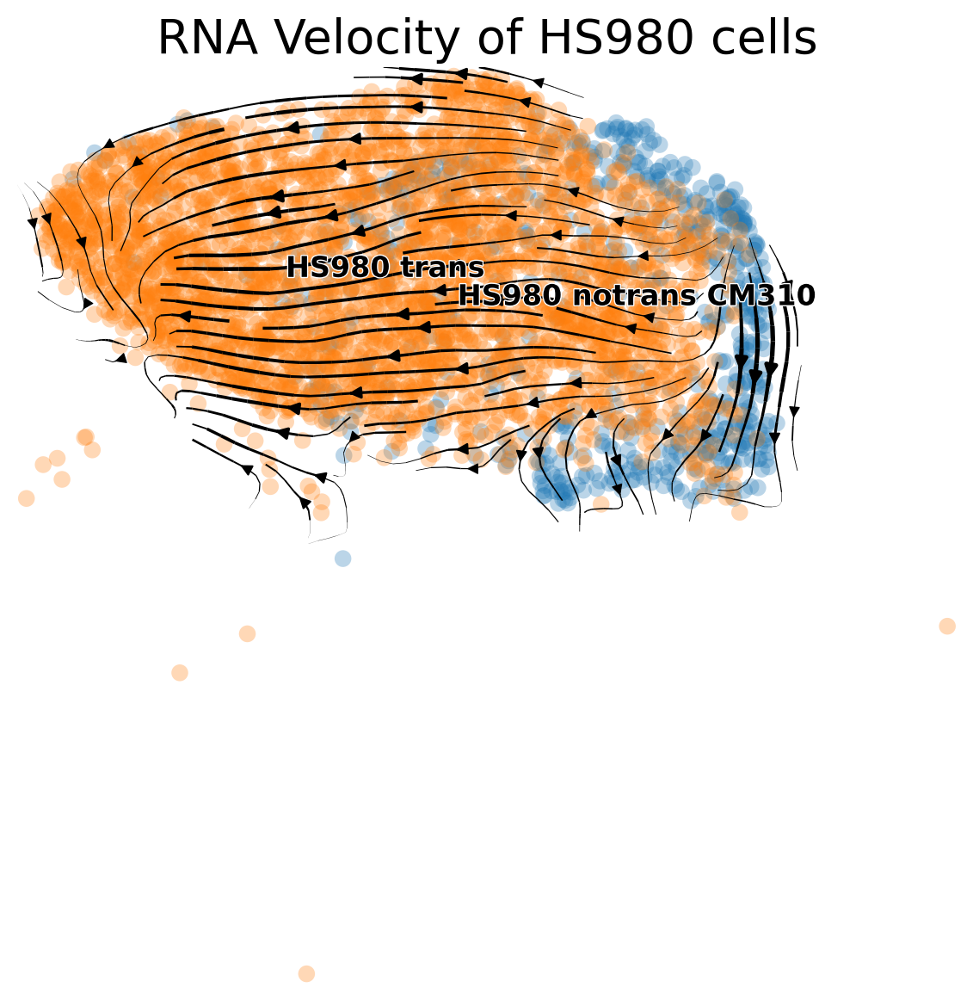

In [61]:
#scv.pl.velocity_embedding_stream(
#    beta_adata, basis='umap',color=["devTime"],fontsize=20,figsize=(7,7),title='RNA Velocity of HS980 cells'
#)

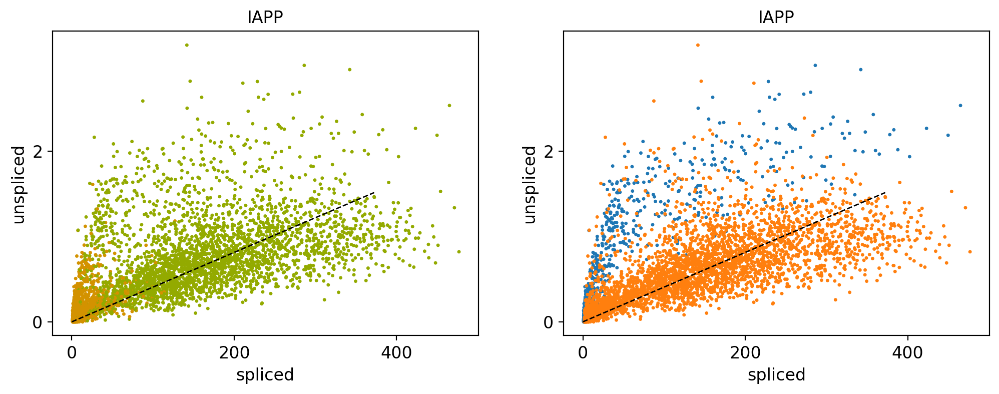

In [62]:
scv.pl.scatter(beta_adata, 'IAPP', color=['EML', 'devTime'],
               add_outline='IAPP in  Beta')


In [63]:
## identifying the important genes
scv.tl.rank_velocity_genes(beta_adata, groupby='EML', min_corr=.3)

df = scv.DataFrame(beta_adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:03) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Early_Beta,Mature_Beta
0,PCDH7,SPATS2L
1,STAG2,ENC1
2,KDM4C,SPOCK3
3,CRYBG3,F10
4,LINC00907,EIF2AK2


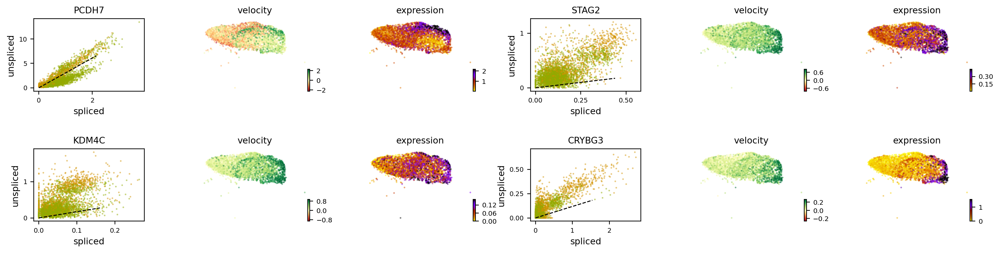

In [109]:
scv.pl.velocity(beta_adata, df['Early_Beta'][:4], ncols=2,color=["EML"])

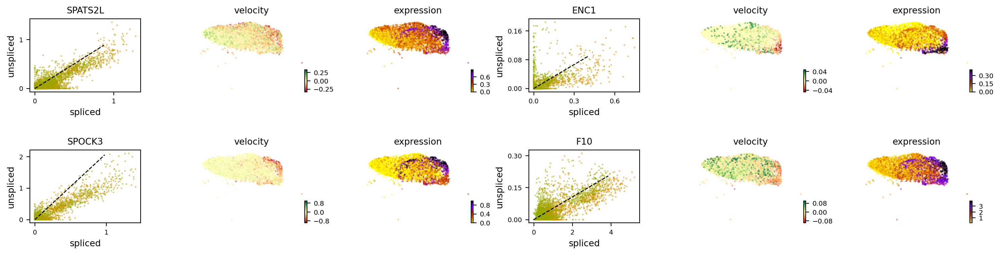

In [108]:
scv.pl.velocity(beta_adata, df['Mature_Beta'][:4], ncols=2,color=["EML"])

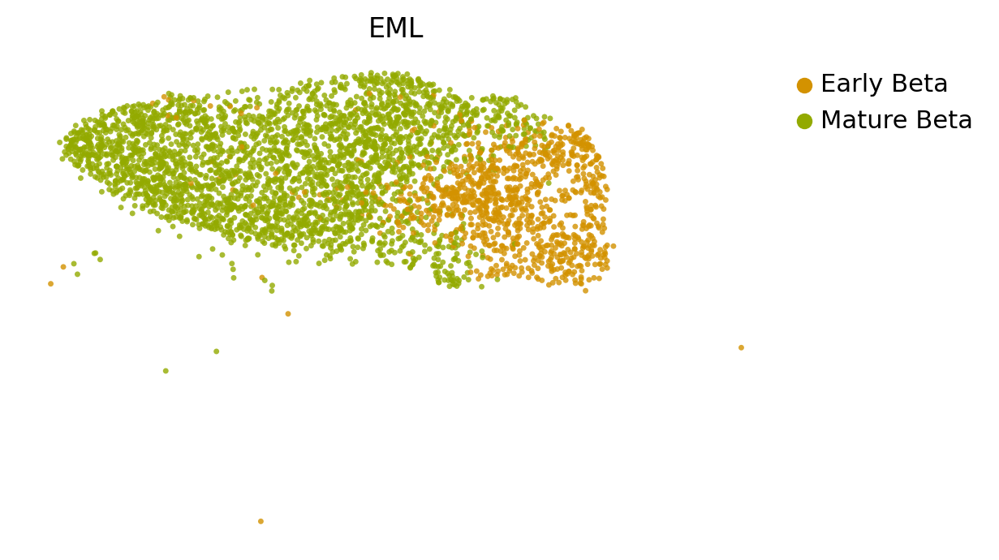

In [111]:
scv.pl.velocity_graph(beta_adata, threshold=.1,color=["EML"])

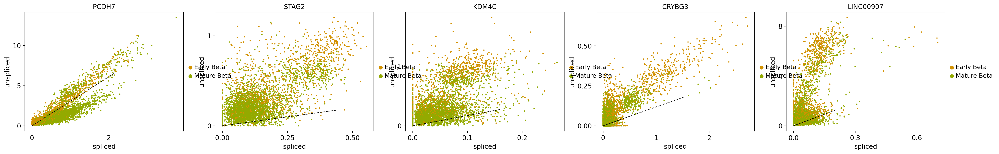

In [76]:
# plot parameters
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='title')

scv.pl.scatter(beta_adata, df['Early_Beta'][:5],color=["EML"],legend_loc="right margin")


In [100]:
beta_vel_rank=pd.DataFrame({"gene" : scv.DataFrame(beta_adata.uns['rank_velocity_genes']['names'])['Early_Beta'],
              "score":scv.DataFrame(beta_adata.uns['rank_velocity_genes']['scores'])['Early_Beta'],"EML":"Early_Beta"
             }).append(
    pd.DataFrame({"gene" : scv.DataFrame(beta_adata.uns['rank_velocity_genes']['names'])['Mature_Beta'],
              "score":scv.DataFrame(beta_adata.uns['rank_velocity_genes']['scores'])['Mature_Beta'],"EML":"Mature_Beta"
             })
)

,gene,score,EML
0,PCDH7,26.170000,Early_Beta
1,STAG2,24.870001,Early_Beta
2,KDM4C,24.450001,Early_Beta
3,CRYBG3,23.969999,Early_Beta
4,LINC00907,20.920000,Early_Beta
...,...,...,...
95,SPON1,-2.650000,Mature_Beta
96,TTR,-2.720000,Mature_Beta
97,B2M,-2.720000,Mature_Beta
98,CLMP,-2.860000,Mature_Beta


### using the dynamic models and identification the driver genes 

In [7]:
#### the dynamic model for all cells are misleading, decide to use dynamic models for beta cells only

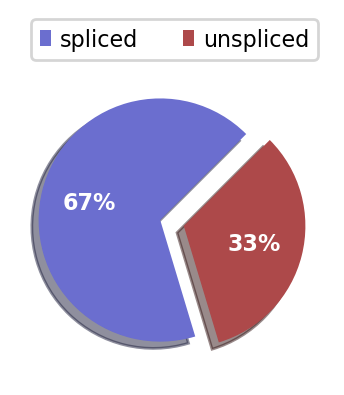

Filtered out 24804 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 15/128 cores)


  0%|          | 0/1068 [00:00<?, ?gene/s]

    finished (0:01:03) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/128 cores)


  0%|          | 0/4086 [00:00<?, ?cells/s]

    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [8]:
adata = scv.read("/home/chenzh/My_project/sc_pan/tmp_data/Oct_2023/Vel/HS980.vel.h5ad")
# susbetting dataset
adata.obsm['X_umap']=adata.obs[["UMAP_1","UMAP_2"]].to_numpy()
adata.obsm['X_umap'].shape

beta_adata=adata[adata.obs["EML"].isin(["Mature_Beta","Early_Beta"])].copy()
del adata 

scv.pl.proportions(beta_adata)
scv.pp.filter_and_normalize(beta_adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(beta_adata, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(beta_adata,n_jobs=15)
scv.tl.velocity(beta_adata, mode='dynamical')
scv.tl.velocity_graph(beta_adata)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


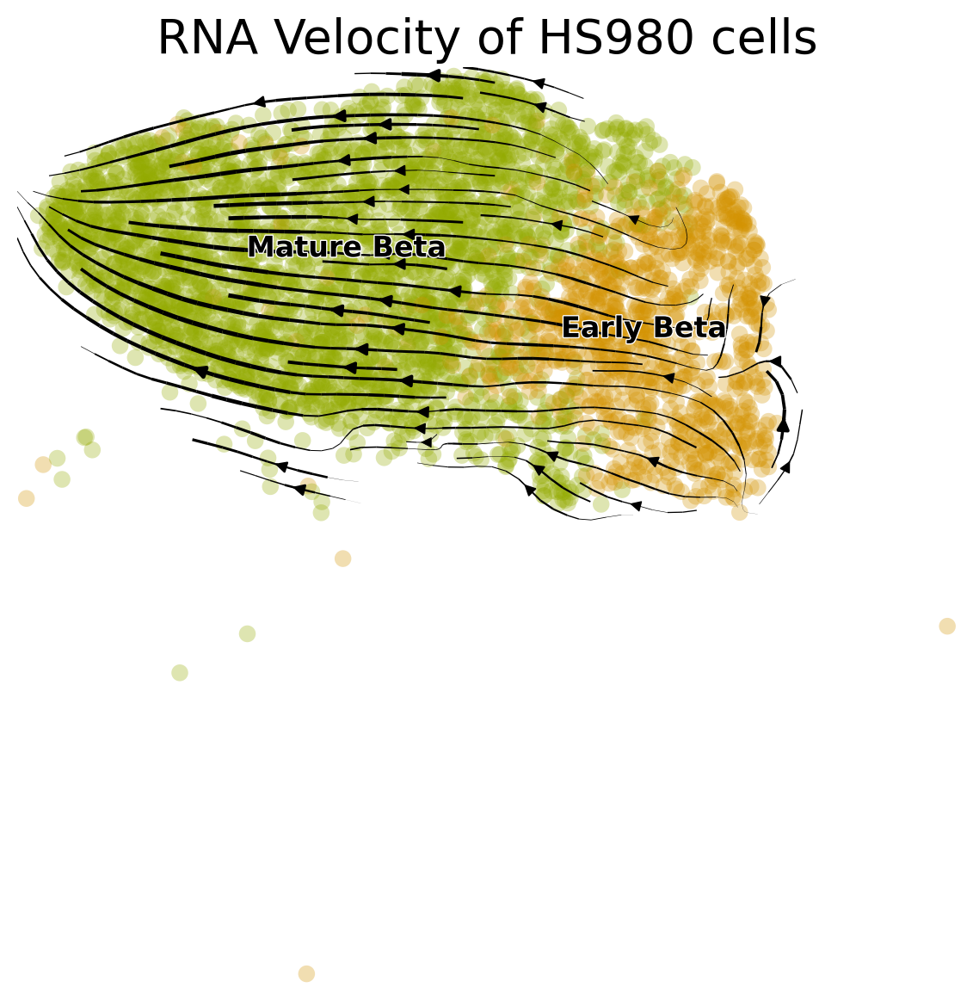

In [9]:
scv.pl.velocity_embedding_stream(
    beta_adata, basis='umap',color="EML",fontsize=20,figsize=(7,7),title='RNA Velocity of HS980 cells',
    palette=p_col,
)


In [11]:
beta_adata.var

,features,unspliced_features,gene_count_corr,means,dispersions,dispersions_norm,highly_variable,fit_r2,fit_alpha,fit_beta,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_genes
ACAP3,ACAP3,ACAP3,0.1409,0.107126,0.422916,0.981306,True,0.010949,0.585315,8.518880,...,0.135939,NaN,0.0,0.0,0.479579,0.073032,0.476161,1.776357e-15,0.953781,False
NPHP4,NPHP4,NPHP4,0.0291,0.026405,0.292185,0.446815,True,-0.119357,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
CLSTN1,CLSTN1,CLSTN1,0.1813,0.240749,0.275904,0.380248,True,0.376561,0.358280,2.082865,...,0.199158,0.259668,0.0,0.0,0.388933,0.144565,0.510792,7.599659e-01,1.821069,True
LZIC,LZIC,LZIC,0.0158,0.224067,0.323246,0.573807,True,-0.197782,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
C1orf127,C1orf127,C1orf127,-0.0434,0.205490,0.308317,0.512769,True,-0.375183,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADGRG4,ADGRG4,ADGRG4,0.0641,0.128082,0.559384,1.539259,True,0.495057,0.108355,0.294803,...,0.095673,0.181255,0.0,0.0,0.399167,0.358180,0.318517,1.223782e+00,2.678150,True
HTATSF1,HTATSF1,HTATSF1,0.3048,0.536225,0.686768,1.204893,True,0.271243,0.437332,1.497760,...,0.541376,0.177175,0.0,0.0,0.481472,0.330133,1.696834,6.893236e-01,3.332855,True
MAMLD1,MAMLD1,MAMLD1,-0.0063,0.034861,0.461765,1.140142,True,-0.223154,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
HMGB3,HMGB3,HMGB3,0.1381,0.183601,0.458648,1.127401,True,-0.009362,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False


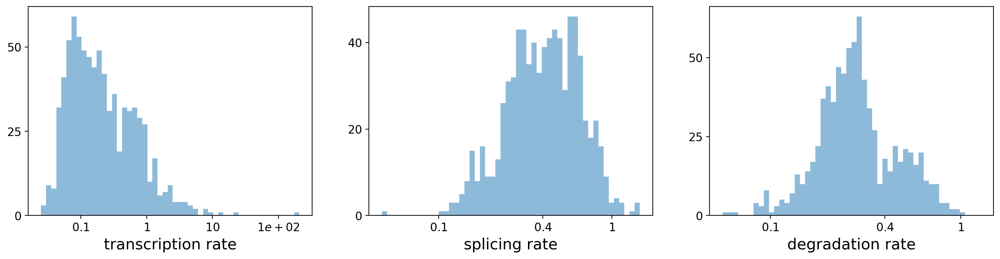

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
CLSTN1,0.376561,0.358280,2.082865,0.352926,6.507672,0.112706,0.048272,0.199158,0.259668,0.0,0.0,0.388933,0.144565,0.510792,0.759966,1.821069
FBXO42,0.238617,0.058463,0.202269,0.293152,10.507646,3.359858,0.102445,0.051987,0.313945,0.0,0.0,0.172522,0.295211,0.154497,0.486057,2.306517
EIF4G3,0.836503,0.578334,0.192968,0.362077,6.124794,1.222651,0.706106,0.272878,0.251650,0.0,0.0,0.479938,2.376619,0.954893,0.588441,1.716590
HNRNPR,0.509939,0.446904,2.055166,0.422512,6.905028,0.124093,0.059989,0.228414,0.376618,0.0,0.0,0.412835,0.164256,0.731757,0.328464,1.764488
FUCA1,0.072989,0.228037,5.137623,0.173968,10.026466,0.028529,0.014108,0.233659,0.097331,0.0,0.0,0.461119,0.042004,0.712465,1.538591,3.070203


In [12]:
## Kenitic rate
df = beta_adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(beta_adata, 'fit*', dropna=True).head()


computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


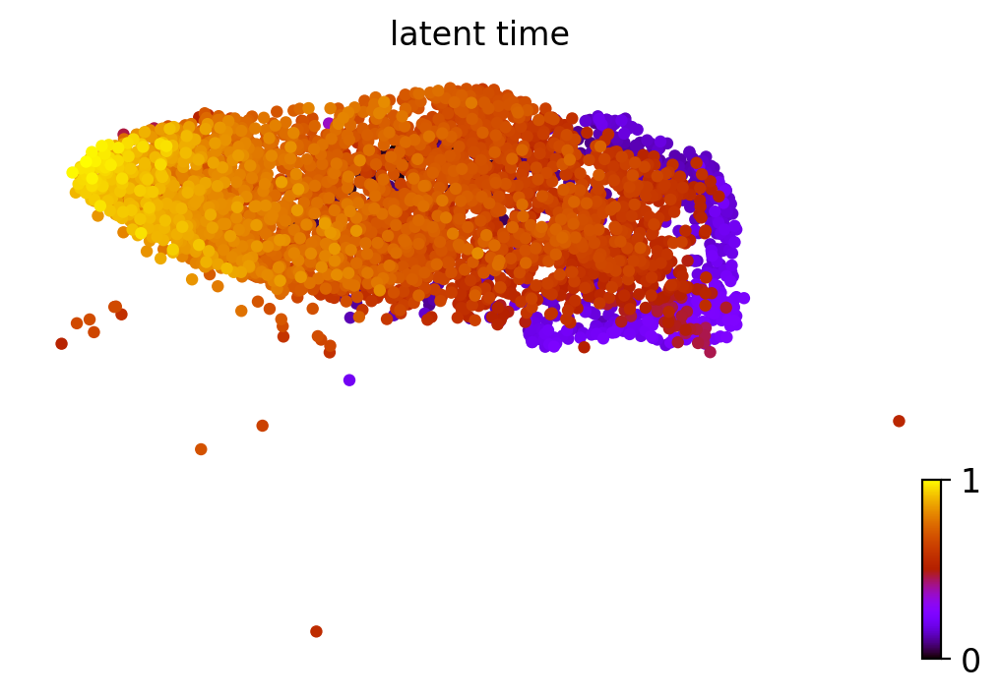

In [13]:
scv.tl.latent_time(beta_adata)
scv.pl.scatter(beta_adata, color='latent_time', color_map='gnuplot', size=80)



In [56]:
df[df['fit_likelihood'] > 0.25].sort_values(by="fit_likelihood",ascending=False)
df[df['features'].isin(['IAPP',  'HOPX', 'IGF2', 'NEFM',"SIX2","LDHA"])]

,features,unspliced_features,gene_count_corr,means,dispersions,dispersions_norm,highly_variable,fit_r2,fit_alpha,fit_beta,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_genes
LDHA,LDHA,LDHA,0.1104,0.137127,0.348930,0.678817,True,0.073748,0.294211,2.498611,...,0.118159,0.000004,0.0,0.0,0.487782,0.233276,0.338056,3.426854,1.500355,False
IAPP,IAPP,IAPP,-0.1701,4.900289,5.106969,0.707107,True,0.154844,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
HOPX,HOPX,HOPX,-0.1554,1.731596,1.190641,0.701279,True,-0.027584,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
NEFM,NEFM,NEFM,0.1689,1.267184,1.753292,1.896453,True,0.783603,5.381783,2.161004,...,1.542245,0.224228,0.0,0.0,0.497776,1.915372,5.635581,0.923066,1.632049,True


In [15]:
#df[['RPL34']]
df = beta_adata.var
df[df['features'].isin(["RPL34","INS"])]

,features,unspliced_features,gene_count_corr,means,dispersions,dispersions_norm,highly_variable,fit_r2,fit_alpha,fit_beta,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_genes
INS,INS,INS,-0.4949,6.444939,5.535492,1.000000,True,0.875493,201.443691,0.083945,...,323.964905,0.983068,0.0,0.0,0.499760,2154.514323,826.658044,0.055235,5.529789,True
RPL34,RPL34,RPL34,-0.5019,3.100214,1.604568,1.356204,True,0.066921,7.450571,17.612418,...,7.192610,0.291961,0.0,0.0,0.497371,0.420692,24.193182,0.643685,3.260539,False


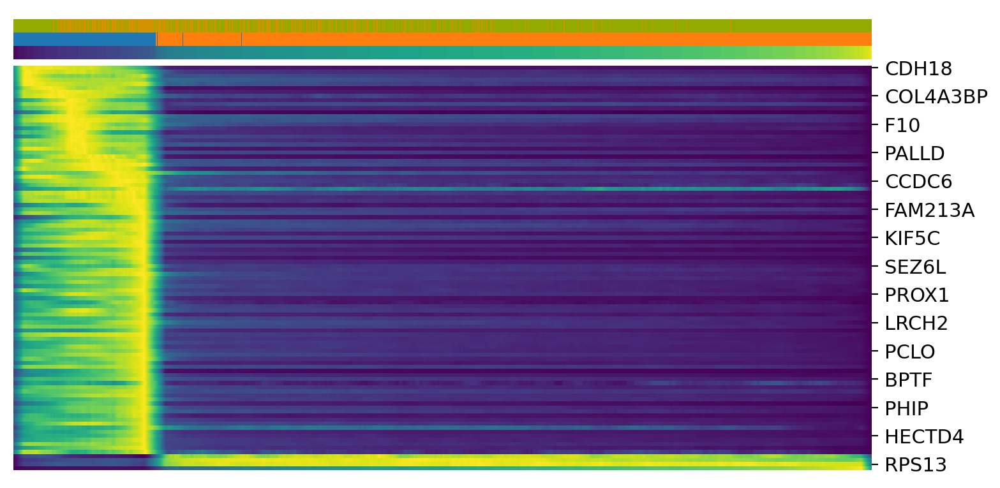

In [18]:
top_genes = beta_adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(beta_adata, var_names=top_genes, sortby='latent_time', col_color=["EML",'devTime',"latent_time"], n_convolve=100)


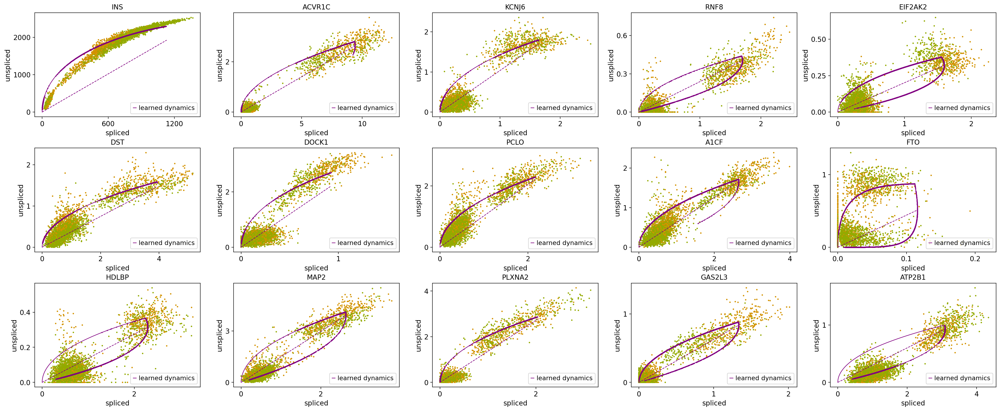

In [49]:
scv.pl.scatter(beta_adata, basis=top_genes[:15], ncols=5, frameon=True,color="EML")

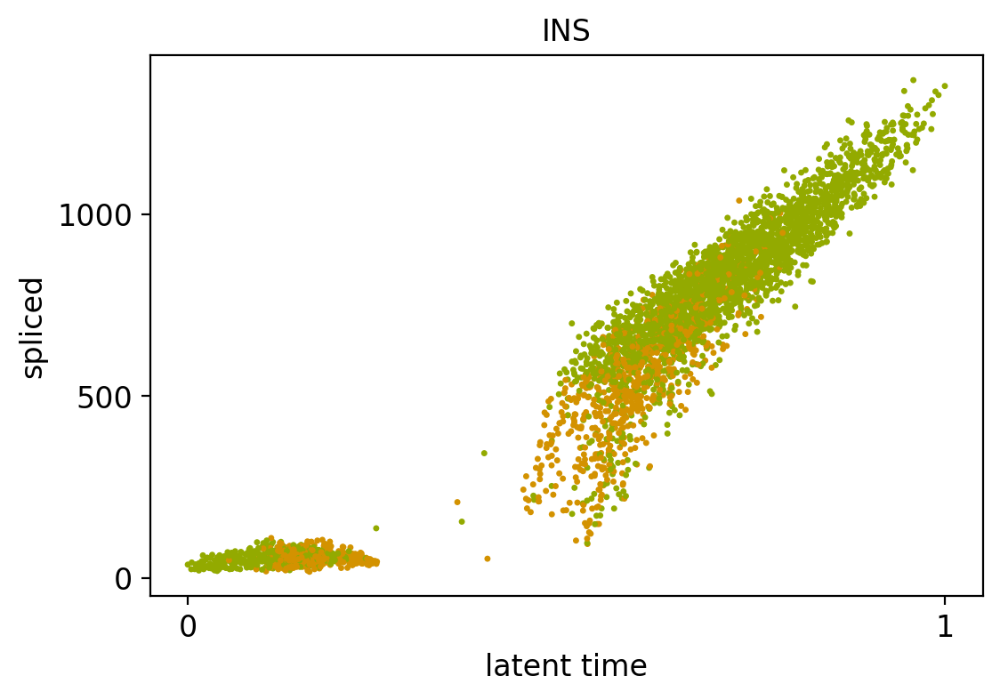

In [48]:
var_names = ['INS', 'ACVR1C', 'KCNJ6', 'EIF2AK2']
#scv.pl.scatter(beta_adata, var_names, frameon=False)
#scv.pl.scatter(beta_adata, basis='INS', frameon=False,color="EML")
#scv.pl.scatter(beta_adata, basis='INS', frameon=True,color="EML")
scv.pl.scatter(beta_adata, x='latent_time', y='INS', frameon=True,use_raw=False,color="EML")


In [42]:
pd.Series("INS").isin(beta_adata.var_names)

0    True
dtype: bool

In [ ]:
beta_adata.var_names